<a href="https://colab.research.google.com/github/nitron-alpha-kplr/Reinforcement-Learning/blob/main/atary_pacman_done_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install numpy
!pip install gym==0.7.4.
!pip install gym[atari]


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.2/152.2 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 853.1/853.1 kB 22.3 MB/s eta 0:00:00
  Created wheel for gym: filename=gym-0.7.4-py3-none-any.whl size=204668 sha256=8dfc88875e02ca31523c3080acabe0e7902872960ff0cda0b54b3331f864d42a
  Stored in directory: /root/.cache/pip/wheels/de/55/26/d9b9f975bc80a53913520dd7ded672660cf82a01ac3b0a8769
Successfully built gym
  Attempting uninstall: gym
    Found existing installation: gym 0.25.2
    Uninstalling gym-0.25.2:
      Successfully uninstalled gym-0.25.2
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.6/540.6 kB 9.5 MB/s eta 0:00:00
 

In [ ]:
!pip install rarfile


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import rarfile

with rarfile.RarFile("Roms.rar", "r") as rf:
    rf.extractall("/content/sample_data")

In [ ]:
!python -m atari_py.import_roms /content/sample_data/ROMS


copying jamesbond.bin from /content/sample_data/ROMS/James Bond 007 (James Bond Agent 007) (1984) (Parker Brothers - On-Time Software, Joe Gaucher, Dan Kurczewski, Louis Marbel, Kathy Von) (PB5110) ~.bin to /usr/local/lib/python3.10/dist-packages/atari_py/atari_roms/jamesbond.bin
copying hero.bin from /content/sample_data/ROMS/H.E.R.O. (1984) (Activision, John Van Ryzin) (AZ-036-04) ~.bin to /usr/local/lib/python3.10/dist-packages/atari_py/atari_roms/hero.bin
copying demon_attack.bin from /content/sample_data/ROMS/Demon Attack (Death from Above) (1982) (Imagic, Rob Fulop) (720000-200, 720101-1B, 720101-1C, IA3200, IA3200C, IX-006-04) ~.bin to /usr/local/lib/python3.10/dist-packages/atari_py/atari_roms/demon_attack.bin
copying donkey_kong.bin from /content/sample_data/ROMS/Donkey Kong (1982) (Coleco - Woodside Design Associates - Imaginative Systems Software, Garry Kitchen) (2451) ~.bin to /usr/local/lib/python3.10/dist-packages/atari_py/atari_roms/donkey_kong.bin
copying journey_escape

In [ ]:
#import the required libraries.
import numpy as np
import gym
import random
import os

# **Pacman!**

In [ ]:
env = gym.make("MsPacman-v0")


INFO:gym.envs.registration:Making new env: MsPacman-v0
[2023-06-22 11:56:28,363] Making new env: MsPacman-v0
/usr/local/lib/python3.10/dist-packages/gym/envs/registration.py:17: PkgResourcesDeprecationWarning: Parameters to load are deprecated.  Call .resolve and .require separately.
  result = entry_point.load(False)


In [ ]:
env.env.frameskip = 3  # Pour réduire la vitesse de jeu


In [ ]:
#check out the pacman action space!
print(env.action_space)

Discrete(9)


In [ ]:
env.env.get_action_meanings()


['NOOP',
 'UP',
 'RIGHT',
 'LEFT',
 'DOWN',
 'UPRIGHT',
 'UPLEFT',
 'DOWNRIGHT',
 'DOWNLEFT']

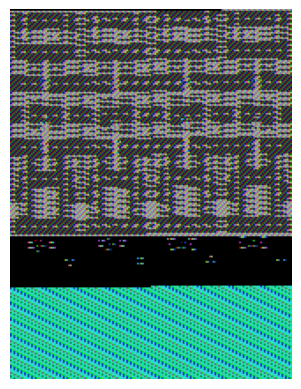

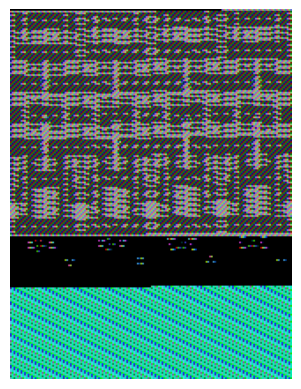

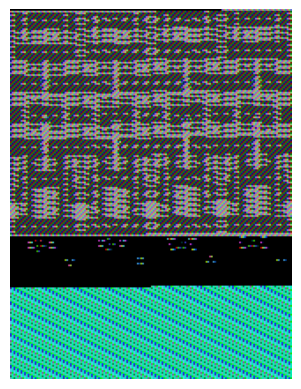

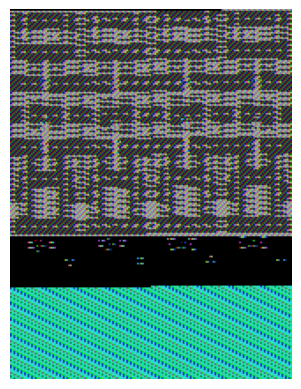

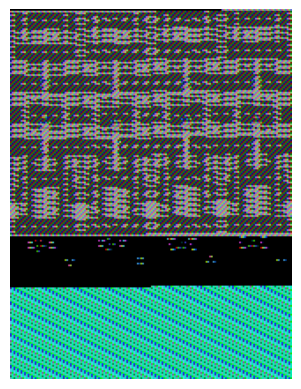

...

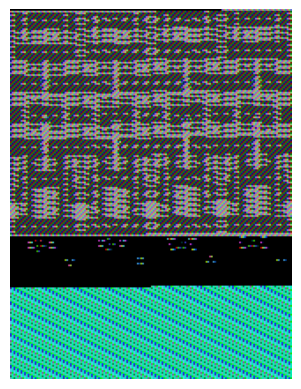

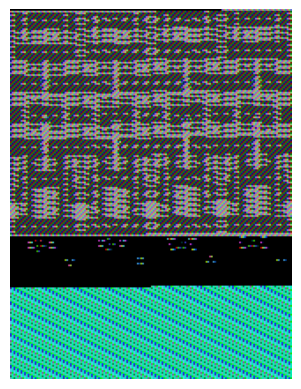

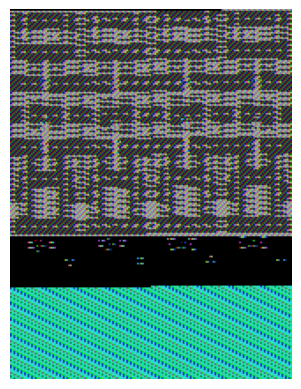

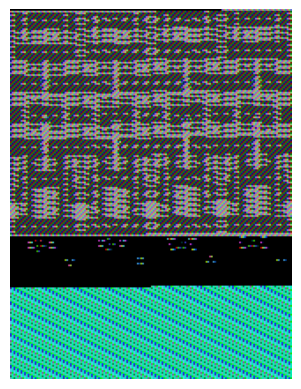

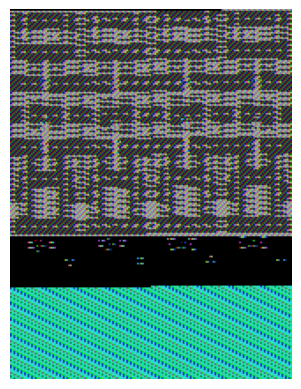

KeyboardInterrupt: ignored

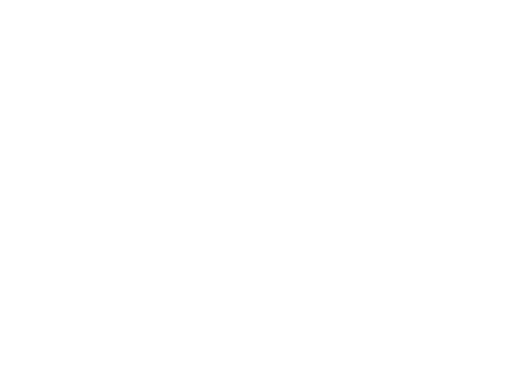

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
Q = np.zeros([210*160, env.action_space.n])
alpha = 0.8
epsilon = 0.1
total_episodes = 500

for episode in range(1, total_episodes + 1):
    done = False
    total_reward = 0
    state = env.reset()
    frames = []  # Liste pour stocker les images de l'épisode
# une boucle while est utilisée pour exécuter les actions dans l'environnement jusqu'à ce que l'épisode soit terminé (done=True).
    while not done:
        if random.random() < epsilon:
            action = random.randint(0, env.action_space.n - 1)  #Explore
        else:
            action = np.argmax(Q[state[:,:,0]])    #Exploite

        next_state, reward, done, info = env.step(action)   #  La prochaine étape (next_state), la récompense (reward), l'état suivant (done)

        # Les valeurs Q sont mises à jour en utilisant l'équation du Q-learning
        Q[state[:,:,0], action] += alpha * (reward + np.max(Q[next_state[:,:,0]]) - Q[state[:,:,0], action])

        # La récompense totale de l'épisode est mise à jour en ajoutant la récompense de l'étape actuelle
        total_reward += reward
        #  l'état courant (state) est mis à jour avec l'état suivant
        state = next_state
        frames.append(env.render(mode='rgb_array'))  # Ajouter l'image à la liste
# Après chaque 50e épisode, la récompense totale de l'épisode est affichée
    if episode % 50 == 0:
        print('Episode {} Total Reward: {}'.format(episode, total_reward))
    # Afficher la vidéo de l'épisode
    show_video(frames)

# evaluate the learned policy
done = False
total_reward = 0
state = env.reset()
# Une fois que tous les épisodes d'apprentissage sont terminés, le code entre dans une autre boucle while pour tester la politique apprise.
while not done:
    action = np.argmax(Q[state[:,:,0]])
    next_state, reward, done, info = env.step(action)
    total_reward += reward
    state = next_state

print('Test Total Reward:', total_reward)

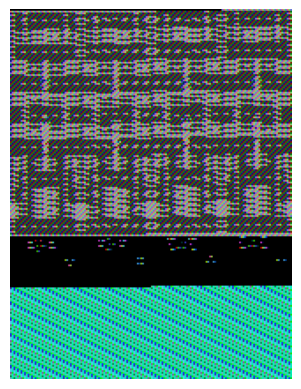

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np

# Capture frames from the environment and store them in a list
frames = []
done = False
state = env.reset()
#  pour capturer les images de l'environnement en utilisant la méthode render avec le mode 'rgb_array'
while not done:
    frames.append(env.render(mode='rgb_array'))
    action = np.argmax(Q[state[:, :, 0]])
    state, reward, done, info = env.step(action)
# pour afficher l'animation des images capturées. Elle prend en argument la liste "frames".
def show_video(frames):
    fig = plt.figure()  # une figure est créée en utilisant plt.figure()
    plt.axis('off')

    # Function to update the frame in the animation
    def update(frame):
        plt.imshow(frame)
        plt.title('Video')
        return [plt.imshow(frame)]

    # Function to initialize the animation
    def init():
        return [plt.imshow(frames[0])]

    # Convert frames to NumPy array with appropriate data type
    frames_np = np.array(frames)

    # Create the animation
    ani = animation.FuncAnimation(fig, update, frames=len(frames_np), init_func=init, interval=50, blit=True)

    # Show the animation
    plt.show()

# Call the show_video() function to display the video
show_video(frames)

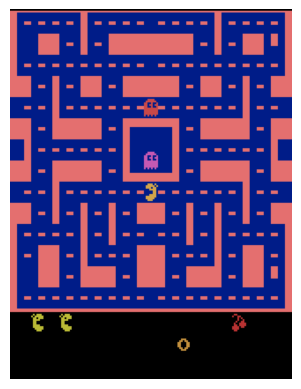

In [ ]:
# ajoute la fonctionnalité de sauvegarde de la vidéo capturée à partir de l'environnement
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
import cv2

# Capture frames from the environment and store them in a list
frames = []
done = False
state = env.reset()
while not done:
    frames.append(env.env.ale.getScreenRGB2())
    action = np.argmax(Q[state[:, :, 0]])
    state, reward, done, info = env.step(action)
    if done:
        break

def save_video(frames, filename):
    fig = plt.figure()
    plt.axis('off')

    # Function to update the frame in the animation
    def update(frame):
        plt.imshow(frame)
        plt.title('Video')
        return [plt.imshow(frame)]

    # Function to initialize the animation
    def init():
        return [plt.imshow(frames[0])]

    # Convert frames to NumPy array with appropriate data type
    frames_np = np.array(frames)

    # Create the animation
    ani = animation.FuncAnimation(fig, update, frames=len(frames_np), init_func=init, interval=50, blit=True)

    # Save the animation as an MP4 video using the specified codec and parameters
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    video_writer = cv2.VideoWriter(filename, fourcc, 30.0, (frames_np.shape[2], frames_np.shape[1]))
    for frame in frames_np:
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
        video_writer.write(frame)
    video_writer.release()

# Call the save_video() function to save the video to a file
save_video(frames, "my_video.mp4")